In [1]:
!pip install minigrid

In [2]:
from __future__ import annotations

from minigrid.core.constants import COLOR_NAMES
from minigrid.core.grid import Grid
from minigrid.core.mission import MissionSpace
from minigrid.core.world_object import Door, Goal, Key, Wall
from minigrid.manual_control import ManualControl
from minigrid.minigrid_env import MiniGridEnv


class SimpleEnv(MiniGridEnv):
    def __init__(
        self,
        size=10,
        agent_start_pos=(1, 1),
        agent_start_dir=0,
        max_steps: int | None = None,
        **kwargs,
    ):
        self.agent_start_pos = agent_start_pos
        self.agent_start_dir = agent_start_dir

        mission_space = MissionSpace(mission_func=self._gen_mission)

        if max_steps is None:
            max_steps = 4 * size**2

        super().__init__(
            mission_space=mission_space,
            grid_size=size,
            # Set this to True for maximum speed
            see_through_walls=True,
            max_steps=max_steps,
            **kwargs,
        )

    @staticmethod
    def _gen_mission():
        return "grand mission"

    def _gen_grid(self, width, height):
        # Create an empty grid
        self.grid = Grid(width, height)

        # Generate the surrounding walls
        self.grid.wall_rect(0, 0, width, height)

        # Generate verical separation wall
        for i in range(0, height):
            self.grid.set(5, i, Wall())
        
        # Place the door and key
        self.grid.set(5, 6, Door(COLOR_NAMES[0], is_locked=True))
        self.grid.set(3, 6, Key(COLOR_NAMES[0]))

        # Place a goal square in the bottom-right corner
        self.put_obj(Goal(), width - 2, height - 2)

        # Place the agent
        if self.agent_start_pos is not None:
            self.agent_pos = self.agent_start_pos
            self.agent_dir = self.agent_start_dir
        else:
            self.place_agent()

        self.mission = "grand mission"


def main():
    env = SimpleEnv(render_mode="human")

    # enable manual control for testing
    manual_control = ManualControl(env, seed=42)
    manual_control.start()

In [3]:
env = SimpleEnv(render_mode="rgb_array")

In [4]:
manual_control = ManualControl(env, seed=42)

In [5]:
import matplotlib.pyplot as plt
from minigrid.wrappers import ImgObsWrapper

In [6]:
env = ImgObsWrapper(env)

In [7]:
manual_control = ManualControl(env, seed=42)

In [8]:
manual_control.reset()

In [55]:
manual_control.step(0)

step=1, reward=0.00


/Users/jseely/miniconda3/envs/myenv2/lib/python3.11/site-packages/gymnasium/core.py:297: UserWarning: WARN: env.step_count to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.step_count` for environment variables or `env.get_attr('step_count')` that will search the reminding wrappers.
  logger.warn(


In [41]:
manual_control.start()

error: video system not initialized

# train a ppo agent

In [9]:
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
import torch.nn as nn
import torch

In [10]:
class MinigridFeaturesExtractor(BaseFeaturesExtractor):
    def __init__(self, observation_space: gym.Space, features_dim: int = 512, normalized_image: bool = False) -> None:
        super().__init__(observation_space, features_dim)
        n_input_channels = observation_space.shape[0]
        self.cnn = nn.Sequential(
            nn.Conv2d(n_input_channels, 16, (2, 2)),
            nn.ReLU(),
            nn.Conv2d(16, 32, (2, 2)),
            nn.ReLU(),
            nn.Conv2d(32, 64, (2, 2)),
            nn.ReLU(),
            nn.Flatten(),
        )

        # Compute shape by doing one forward pass
        with torch.no_grad():
            n_flatten = self.cnn(torch.as_tensor(observation_space.sample()[None]).float()).shape[1]

        self.linear = nn.Sequential(nn.Linear(n_flatten, features_dim), nn.ReLU())

    def forward(self, observations: torch.Tensor) -> torch.Tensor:
        return self.linear(self.cnn(observations))

In [11]:
import gymnasium as gym

In [68]:
import minigrid
from minigrid.wrappers import ImgObsWrapper
from stable_baselines3 import PPO

policy_kwargs = dict(
    features_extractor_class=MinigridFeaturesExtractor,
    features_extractor_kwargs=dict(features_dim=128),
)

env = gym.make("MiniGrid-Empty-16x16-v0", render_mode="rgb_array")
env = ImgObsWrapper(env)

model = PPO("CnnPolicy", env, policy_kwargs=policy_kwargs, verbose=1)
model.learn(2e5)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


/Users/jseely/miniconda3/envs/myenv2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1.02e+03 |
|    ep_rew_mean     | 0        |
| time/              |          |
|    fps             | 1580     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.02e+03    |
|    ep_rew_mean          | 0           |
| time/                   |             |
|    fps                  | 502         |
|    iterations           | 2           |
|    time_elapsed         | 8           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.006608704 |
|    clip_fraction        | 0.0375      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.94       |
|    explained_variance   | -2.63       |
|    learning_rate        | 0.

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.02e+03    |
|    ep_rew_mean          | 0           |
| time/                   |             |
|    fps                  | 324         |
|    iterations           | 11          |
|    time_elapsed         | 69          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.013157995 |
|    clip_fraction        | 0.138       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.81       |
|    explained_variance   | -8.3        |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0171     |
|    n_updates            | 100         |
|    policy_gradient_loss | -0.0109     |
|    value_loss           | 3.1e-05     |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 1.02e+03

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.02e+03    |
|    ep_rew_mean          | 0           |
| time/                   |             |
|    fps                  | 310         |
|    iterations           | 21          |
|    time_elapsed         | 138         |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.029412482 |
|    clip_fraction        | 0.166       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | -3.07       |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0014     |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.00899    |
|    value_loss           | 0.000482    |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.02e+

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.02e+03    |
|    ep_rew_mean          | 0           |
| time/                   |             |
|    fps                  | 309         |
|    iterations           | 31          |
|    time_elapsed         | 204         |
|    total_timesteps      | 63488       |
| train/                  |             |
|    approx_kl            | 0.013957702 |
|    clip_fraction        | 0.129       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | -7.06       |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0399     |
|    n_updates            | 300         |
|    policy_gradient_loss | -0.00667    |
|    value_loss           | 6.44e-05    |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1.02e+

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 883         |
|    ep_rew_mean          | 0.149       |
| time/                   |             |
|    fps                  | 309         |
|    iterations           | 41          |
|    time_elapsed         | 271         |
|    total_timesteps      | 83968       |
| train/                  |             |
|    approx_kl            | 0.018950464 |
|    clip_fraction        | 0.194       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.289       |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0211     |
|    n_updates            | 400         |
|    policy_gradient_loss | -0.0105     |
|    value_loss           | 0.00757     |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 777   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 38.1        |
|    ep_rew_mean          | 0.967       |
| time/                   |             |
|    fps                  | 308         |
|    iterations           | 51          |
|    time_elapsed         | 338         |
|    total_timesteps      | 104448      |
| train/                  |             |
|    approx_kl            | 0.005870933 |
|    clip_fraction        | 0.0884      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.742      |
|    explained_variance   | 0.505       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.00214     |
|    n_updates            | 500         |
|    policy_gradient_loss | -0.0068     |
|    value_loss           | 0.00727     |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 34.4  

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 28.2         |
|    ep_rew_mean          | 0.975        |
| time/                   |              |
|    fps                  | 313          |
|    iterations           | 61           |
|    time_elapsed         | 398          |
|    total_timesteps      | 124928       |
| train/                  |              |
|    approx_kl            | 0.0010911464 |
|    clip_fraction        | 0.0276       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.192       |
|    explained_variance   | 0.604        |
|    learning_rate        | 0.0003       |
|    loss                 | -0.00991     |
|    n_updates            | 600          |
|    policy_gradient_loss | -0.00335     |
|    value_loss           | 0.00221      |
------------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 30.9       |
|    ep_rew_mean          | 0.973      |
| time/                   |            |
|    fps                  | 323        |
|    iterations           | 71         |
|    time_elapsed         | 450        |
|    total_timesteps      | 145408     |
| train/                  |            |
|    approx_kl            | 0.03137347 |
|    clip_fraction        | 0.0667     |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.239     |
|    explained_variance   | 0.294      |
|    learning_rate        | 0.0003     |
|    loss                 | -0.000345  |
|    n_updates            | 700        |
|    policy_gradient_loss | -0.00455   |
|    value_loss           | 0.00661    |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 29.6        |
|    ep_rew_m

-------------------------------------------
| rollout/                |               |
|    ep_len_mean          | 27.4          |
|    ep_rew_mean          | 0.976         |
| time/                   |               |
|    fps                  | 330           |
|    iterations           | 81            |
|    time_elapsed         | 501           |
|    total_timesteps      | 165888        |
| train/                  |               |
|    approx_kl            | 0.00022791413 |
|    clip_fraction        | 0.00454       |
|    clip_range           | 0.2           |
|    entropy_loss         | -0.0975       |
|    explained_variance   | 0.607         |
|    learning_rate        | 0.0003        |
|    loss                 | -0.000965     |
|    n_updates            | 800           |
|    policy_gradient_loss | -0.000326     |
|    value_loss           | 0.0021        |
-------------------------------------------
-------------------------------------------
| rollout/                |     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 27.1        |
|    ep_rew_mean          | 0.976       |
| time/                   |             |
|    fps                  | 336         |
|    iterations           | 91          |
|    time_elapsed         | 554         |
|    total_timesteps      | 186368      |
| train/                  |             |
|    approx_kl            | 0.006208037 |
|    clip_fraction        | 0.00669     |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.0265     |
|    explained_variance   | 0.62        |
|    learning_rate        | 0.0003      |
|    loss                 | -0.00302    |
|    n_updates            | 900         |
|    policy_gradient_loss | -0.00113    |
|    value_loss           | 0.00204     |
-----------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 27.1

# simple mdp from gpt

In [13]:
import numpy as np

class Gridworld:
    def __init__(self, size=5, stochastic=False):
        self.size = size
        self.stochastic = stochastic
        self.states = np.arange(size * size).reshape((size, size))
        self.values = np.zeros((size, size))
        self.policy = np.ones((size, size, 4)) / 4  # Uniform random policy
        self.terminal_states = [(size-1, size-1)]
        self.action_space = ['up', 'down', 'left', 'right']
        
    def step(self, state, action):
        if state in self.terminal_states:
            return state, 0
        
        next_state = list(state)
        if action == 'up':
            next_state[0] = max(0, state[0] - 1)
        elif action == 'down':
            next_state[0] = min(self.size - 1, state[0] + 1)
        elif action == 'left':
            next_state[1] = max(0, state[1] - 1)
        elif action == 'right':
            next_state[1] = min(self.size - 1, state[1] + 1)
        
        if self.stochastic and np.random.rand() < 0.1:
            next_state = [np.random.randint(self.size), np.random.randint(self.size)]
        
        return tuple(next_state), -1


In [14]:
import numpy as np

class MDP:
    def __init__(self):
        self.state_inds = list(range(10))
        self.state_vals = [f"S{i}" for i in self.state_inds]
        self.actions = {i: [f"A{j}" for j in range(3)] for i in self.state_inds}
        self.rewards = [-1 for i in self.state_inds]
        
        self.terminal_states = ["S0"]
        self.state = "S8"
        
        self.gamma = 0.95
        
        self.total_reward = 0
        
    def transition(self, action):
        # formally:
        # takes input state and action
        # produces a s x r grid (all possible next states, all possible rewards)
        # in that grid we have real values
        # sum of those values must be 1.
        # sample to get the next state and reward
        
        
        # Currently the transition dynamics are deterministic
        state = self.state
        state_ind = self.state_vals.index(state)
        # assert action is in A(s)
        if action == "A0":
            next_state_ind = max(state_ind - 1, 0)
        elif action == "A1":
            next_state_ind = state_ind
        elif action == "A2":
            next_state_ind = min(state_ind + 1, len(self.state_inds)-1)
        
        reward = self.rewards[next_state_ind]
        next_state = self.state_vals[next_state_ind]
        
        # iterate:
        self.state = next_state
        self.total_reward += reward
                
        return next_state, reward


# policy

In [37]:
class StochasticPolicy:
    def __init__(self, mdp_instance):
        """
        mdp_instance: MDP
            An instance of the MDP class.
        """
        self.policy = {}
        
        # Iterate over all states in the MDP
        for state in mdp_instance.state_vals:
            # Correcting the key access to use integers for the actions dictionary
            state_index = mdp_instance.state_vals.index(state)
            actions = mdp_instance.actions[state_index]
            num_actions = len(actions)
            
            # Assign equal probabilities to each action for the state
            # action_probabilities = {action: 1.0 / num_actions for action in actions}
            # action_probabilities = {"A0": 0.9, "A1": 0.05, "A2": 0.05}
            action_probabilities = {"A0": 1.0, "A1": 0.0, "A2": 0.0}
            self.policy[state] = action_probabilities
    
    def get_action(self, state, rng=None):
        """
        Samples and returns an action for the given state based on the policy probabilities.
        """
        if rng is None:
            rng = np.random.default_rng()
        
        actions = list(self.policy[state].keys())
        probabilities = list(self.policy[state].values())
        
        return rng.choice(actions, p=probabilities)


# simulate


In [38]:
world = MDP()

policy = StochasticPolicy(world)

step = 0
while world.state not in world.terminal_states:
    step += 1
    state = world.state
    action = policy.get_action(state)
    next_state, reward = world.transition(action)

# value function

In [54]:
class ValueFunctions:
    def __init__(self, mdp_instance, policy_instance):
        self.V = {state: 0.1.*np.random.randn() for state in mdp_instance.state_vals}
        self.mdp = mdp_instance
        self.policy = policy_instance
        
    def policy_evaluation(self, theta=1e-9, max_iterations=100):
        """
        Perform policy evaluation to estimate the value function V(s) for the given policy.
        
        :param theta: float, threshold for determining convergence
        :param max_iterations: int, maximum number of iterations to prevent infinite loops
        :return: None, updates the V attribute in place
        """
        for iteration in range(max_iterations):
            delta = 0  # To check for convergence
            for state in self.V:
                if state in self.mdp.terminal_states:
                    continue  # Skip update for terminal states
                v = self.V[state]
                
                # Save current state
                current_state = self.mdp.state
                
                # Set MDP state to current state for evaluation
                self.mdp.state = state
                
                # Get action probabilities from policy
                action_probs = self.policy.policy.get(state, {})
                
                # Update V(s) based on expected return
                new_v = 0
                for action, action_prob in action_probs.items():
                    next_state, reward = self.mdp.transition(action)
                    
                    # Update value function
                    new_v += action_prob * (reward + self.mdp.gamma * self.V[next_state])
                    
                    # Revert MDP state for next calculations
                    self.mdp.state = state
                
                # Update V(s) and track maximum change for convergence check
                self.V[state] = new_v
                delta = max(delta, abs(v - new_v))
                
                # Restore the original state
                self.mdp.state = current_state
            
            # Check for convergence
            if delta < theta:
                print(f'Policy Evaluation converged in {iteration + 1} iterations.')
                break
        else:
            print('Policy Evaluation reached maximum iterations without convergence.')
            


SyntaxError: invalid syntax (133108586.py, line 3)

In [55]:
# Initialize value functions
value_functions = ValueFunctions(world, policy)

# Perform policy evaluation
value_functions.policy_evaluation()

# Show resulting value function
value_functions.V


Policy Evaluation converged in 2 iterations.


{'S0': -0.0,
 'S1': -1.0,
 'S2': -1.95,
 'S3': -2.8525,
 'S4': -3.709875,
 'S5': -4.524381249999999,
 'S6': -5.298162187499999,
 'S7': -6.033254078124999,
 'S8': -6.731591374218749,
 'S9': -7.395011805507812}

In [52]:
# Initialize value functions
value_functions = ValueFunctions(world, policy)

# Perform policy evaluation
value_functions.policy_evaluation()

# Show resulting value function
value_functions.V


Policy Evaluation converged in 2 iterations.


{'S0': 0.0,
 'S1': -1.0,
 'S2': -1.95,
 'S3': -2.8525,
 'S4': -3.709875,
 'S5': -4.524381249999999,
 'S6': -5.298162187499999,
 'S7': -6.033254078124999,
 'S8': -6.731591374218749,
 'S9': -7.395011805507812}

In [53]:
value_functions.V

{'S0': 0.0,
 'S1': -1.0,
 'S2': -1.95,
 'S3': -2.8525,
 'S4': -3.709875,
 'S5': -4.524381249999999,
 'S6': -5.298162187499999,
 'S7': -6.033254078124999,
 'S8': -6.731591374218749,
 'S9': -7.395011805507812}

In [43]:
import matplotlib.pyplot as plt

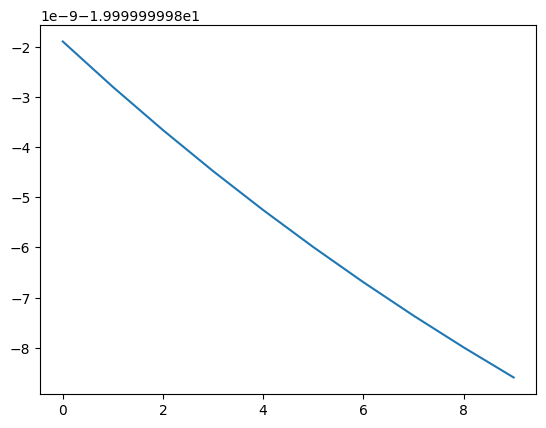

In [44]:
plt.plot(value_functions.V.values())

# as gym environment

In [8]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np

class CustomMDP(gym.Env):
    def __init__(self):
        super().__init__()
        self.action_space = spaces.Discrete(3)
        self.observation_space = spaces.Discrete(10)
        self.state = 8
        self.terminal_states = [0]
        self.gamma = 1.0
        self.total_reward = 0

    def step(self, action):
        if self.state in self.terminal_states:
            return self.state, 0, True, {}  # Terminal state, no reward, episode is done
        
        if action == 0:  # "A0"
            next_state = max(self.state - 1, 0)
        elif action == 1:  # "A1"
            next_state = self.state
        elif action == 2:  # "A2"
            next_state = min(self.state + 1, 9)
        
        reward = -1
        self.state = next_state
        self.total_reward += reward
        done = self.state in self.terminal_states
        return self.state, reward, done, {}

    def reset(self, seed=None):
        self.state = 8
        self.total_reward = 0
        return self.state

    def render(self, mode='human'):
        print(f"State: {self.state}, Total Reward: {self.total_reward}")

env = CustomMDP()


In [9]:
??env

Type:            CustomMDP
String form:     <CustomMDP instance>
Docstring:       <no docstring>
Class docstring:
The main Gymnasium class for implementing Reinforcement Learning Agents environments.

The class encapsulates an environment with arbitrary behind-the-scenes dynamics through the :meth:`step` and :meth:`reset` functions.
An environment can be partially or fully observed by single agents. For multi-agent environments, see PettingZoo.

The main API methods that users of this class need to know are:

- :meth:`step` - Updates an environment with actions returning the next agent observation, the reward for taking that actions,
  if the environment has terminated or truncated due to the latest action and information from the environment about the step, i.e. metrics, debug info.
- :meth:`reset` - Resets the environment to an initial state, required before calling step.
  Returns the first agent observation for an episode and information, i.e. metrics, debug info.
- :meth:`render` 

In [10]:
env.reset()
done = False
while not done:
    action = env.action_space.sample()
    state, reward, done, _ = env.step(action)
    env.render()



State: 8, Total Reward: -1
State: 8, Total Reward: -2
State: 7, Total Reward: -3
State: 6, Total Reward: -4
State: 7, Total Reward: -5
State: 7, Total Reward: -6
State: 6, Total Reward: -7
State: 5, Total Reward: -8
State: 6, Total Reward: -9
State: 7, Total Reward: -10
State: 7, Total Reward: -11
State: 7, Total Reward: -12
State: 8, Total Reward: -13
State: 8, Total Reward: -14
State: 7, Total Reward: -15
State: 8, Total Reward: -16
State: 7, Total Reward: -17
State: 7, Total Reward: -18
State: 6, Total Reward: -19
State: 5, Total Reward: -20
State: 5, Total Reward: -21
State: 4, Total Reward: -22
State: 3, Total Reward: -23
State: 3, Total Reward: -24
State: 4, Total Reward: -25
State: 5, Total Reward: -26
State: 6, Total Reward: -27
State: 5, Total Reward: -28
State: 5, Total Reward: -29
State: 4, Total Reward: -30
State: 3, Total Reward: -31
State: 4, Total Reward: -32
State: 3, Total Reward: -33
State: 2, Total Reward: -34
State: 1, Total Reward: -35
State: 1, Total Reward: -36
S

In [11]:
import stable_baselines3 as sb3

# Define the agent (policy)
agent = sb3.PPO("MlpPolicy", env, verbose=1)

# Train the agent
agent.learn(total_timesteps=10000)


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


TypeError: cannot unpack non-iterable int object

In [12]:
obs = env.reset()
done = False
while not done:
    action, _ = agent.predict(obs, deterministic=True)
    obs, reward, done, _ = env.step(action)
    env.render()


State: 7, Total Reward: -1
State: 8, Total Reward: -2
State: 7, Total Reward: -3
State: 8, Total Reward: -4
State: 7, Total Reward: -5
State: 8, Total Reward: -6
State: 7, Total Reward: -7
State: 8, Total Reward: -8
State: 7, Total Reward: -9
State: 8, Total Reward: -10
State: 7, Total Reward: -11
State: 8, Total Reward: -12
State: 7, Total Reward: -13
State: 8, Total Reward: -14
State: 7, Total Reward: -15
State: 8, Total Reward: -16
State: 7, Total Reward: -17
State: 8, Total Reward: -18
State: 7, Total Reward: -19
State: 8, Total Reward: -20
State: 7, Total Reward: -21
State: 8, Total Reward: -22
State: 7, Total Reward: -23
State: 8, Total Reward: -24
State: 7, Total Reward: -25
State: 8, Total Reward: -26
State: 7, Total Reward: -27
State: 8, Total Reward: -28
State: 7, Total Reward: -29
State: 8, Total Reward: -30
State: 7, Total Reward: -31
State: 8, Total Reward: -32
State: 7, Total Reward: -33
State: 8, Total Reward: -34
State: 7, Total Reward: -35
State: 8, Total Reward: -36
S

KeyboardInterrupt: 

In [74]:
env.observation_space.n

10

In [93]:
agent.policy.evaluate_actions(torch.tensor(5).float().unsqueeze(0), torch.tensor(0).float().unsqueeze(0))




(tensor([[-8.6295]], grad_fn=<AddmmBackward0>),
 tensor([-0.1808], grad_fn=<SqueezeBackward1>),
 tensor([0.5293], grad_fn=<NegBackward0>))

In [94]:
import torch

value_estimates = []

for state in range(env.observation_space.n):
    obs_tensor = torch.tensor([state]).float().unsqueeze(0)
    # You can pass dummy actions since they are not used for value estimation
    actions = torch.tensor([0]).float().unsqueeze(0)
    value, _, _ = agent.policy.evaluate_actions(obs_tensor, actions)
    value_estimates.append(value.item())

# Print the value function estimates
for state, value in enumerate(value_estimates):
    print(f"V(S{state}) = {value:.4f}")


V(S0) = -6.9095
V(S1) = -1.7492
V(S2) = -3.4851
V(S3) = -5.0116
V(S4) = -6.7519
V(S5) = -8.6295
V(S6) = -10.3512
V(S7) = -11.7872
V(S8) = -13.6212
V(S9) = -15.9645
